8 May 2020

# Identify Mutation Hotspots

This document contains some visuals & basic analysis on the alignment sets. 

Key points I observed:
* The sequence lengths differ in each set (my assumption is that augur caused these). How should we handle different sequence lengths, are the additional bases are added to front/back etc.
* The leaves in training and test sets looks suspiciously different. I expected them to have more similar pattern. For instance, if you look at the positions [400,600) in 50/50 set, training mostly has '-' and test set has few '-'. Similarly for 80/20 set, you can look at [300,600).  

In [1]:
from load_fasta import fasta_to_dict, seq_one_hot, marginal_seq_one_hot
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def normalise_matrix(data, axis=0):
    """ Normalises the matrix based on the specified axis. """
    return data / np.sum(data, axis=axis, keepdims=True)

def plot_sequence_heatmap(data, filename=None, title=None, x_label="Positions", y_label="Nucleotides", y_ticks=None, batch=True, batch_size=100):
    """ Plots heatmap of sequence matrix (rows corresponds nucleotides, columns correspond to genomic location). """
    if y_ticks is None:
        y_ticks = ['A', 'C', 'G', 'T', '-', 'N']

    plt.figure(figsize=(20, 5))
    plt.imshow(data, interpolation="nearest", cmap='Blues')
    plt.xticks([], [])
    plt.xlabel(x_label)
    plt.yticks(np.arange(data.shape[0]), y_ticks[0:data.shape[0]])
    plt.ylabel(y_label)
    plt.ylim([data.shape[0] - 0.5, -0.5])
    #plt.colorbar()
    if title is not None:
        plt.title(title)
    if filename is not None:
        plt.savefig(filename)

    else:
        plt.show()
        
def find_hotspots(fasta_file, normalise=True, decimal_round=3, characters=['A', 'C', 'G', 'T', '-', 'N']):
    print("\nFinding hotspots...\n")
    
    # Create a marginal one-hot sequence matrix, meaning sum up one-hot matrices of all samples
    print("Marginal one-hot sequence matrix is creating...")
    data = marginal_seq_one_hot(fasta_file, characters=characters)
    print("\tdata.shape: ", data.shape)
    
    # Normalise data
    if normalise:
        print("Normalising the data matrix...")
        data = normalise_matrix(data)
    
    # Calculate the majority percentages
    print("Calculating the majority percentages...")
    majority_perc_dict = {}
    max_perc_list = np.max(data, axis=0)
    for pos in range(data.shape[1]):
        perc = max_perc_list[pos]
        rounded_perc = round(perc, decimal_round)
        if rounded_perc not in majority_perc_dict:
            temp = {}
            temp['count'] = 1
            temp['pos'] = [pos]
            majority_perc_dict[rounded_perc] = temp
        else:
            majority_perc_dict[rounded_perc]['count'] = majority_perc_dict[rounded_perc]['count'] + 1
            pos_list = majority_perc_dict[rounded_perc]['pos']
            pos_list.append(pos)
            majority_perc_dict[rounded_perc]['pos'] = pos_list
    for key in sorted(majority_perc_dict):
        print("\tMajority Perc.: ", key, "\tOccurrence: ", majority_perc_dict[key]['count'])#, "\tPos: ", majority_perc_dict[key]['pos'])
    print("\n\tTotal number of conflicted positions: ", data.shape[1]-majority_perc_dict[1.0]['count'])
    
    # Extract hotspot information
    print("\nExtracting hotspot information...")
    hotspots = set()
    summ = 0
    for key in sorted(majority_perc_dict):
        summ = summ + majority_perc_dict[key]['count']
        if key < 1.0:
            for pos in majority_perc_dict[key]['pos']:
                hotspots.add(pos)
    hotspots = sorted(list(hotspots))
    hotspot_mat = np.take(data, hotspots, axis=1)
    print("\thotspot_mat.shape", hotspot_mat.shape)

    return data, majority_perc_dict, hotspots, hotspot_mat

## Check the stats of the datasets we have

Below cells have some stats the datasets we have. I only look at the observed samples (not the internal nodes). 

In summary,
* 50/50 dataset: There are 3,650 leaf samples in the training and 3,650 leaf samples in the test set. The genome length of training set is 36,314 whereas 34,292 in the test set.
* 80/20 dataset: There are 5,839 leaf samples in the training and 1,461 leaf samples in the test set. The genome length of training set is 38,245 whereas 31,832 in the test set.

All these genome lengths were different, therefore I also checked the first alignment file we had (from 2020-04-16).
* There are 7,299 leaf samples and each of them has 39,178 bases. 

### Check the stats of 50/50 dataset

In [2]:
# Load a fasta file and convert it into a dict
infile = 'data/2020-05-07/gisaid_cov2020.train_50.augur_seq.ali.fasta.gz'
print("\nConverting ", infile, " into dict...")
fasta_file_temp = fasta_to_dict(infile)
print("\tNumber of keys in dict: ", len(list(fasta_file_temp.keys())))

# Work only with the leaves
max_length = 0
length_dist = {}
fasta_file = {}
for key in fasta_file_temp:
    if key[0:3] == "EPI":
        fasta_file[key] = fasta_file_temp[key]
        seq_len = len(fasta_file[key])
        max_length = max(max_length, seq_len)
        if seq_len not in length_dist:
            length_dist[seq_len] = 1
        else:
            length_dist[seq_len] = length_dist[seq_len] + 1
        
print("\tNumber of observations in dict: ", len(list(fasta_file.keys())))
print("\tMaximum sequence length: ", max_length)
print("\tSequence length distribution:")
for key in sorted(length_dist.keys()):
    print("\tLength: ", key, "\tOccurrence: ", length_dist[key])


Converting  data/2020-05-07/gisaid_cov2020.train_50.augur_seq.ali.fasta.gz  into dict...
	Number of keys in dict:  7299
	Number of observations in dict:  3650
	Maximum sequence length:  36314
	Sequence length distribution:
	Length:  36314 	Occurrence:  3650


In [3]:
# Load a fasta file and convert it into a dict
infile = 'data/2020-05-07/gisaid_cov2020.test_50.augur_seq.ali.fasta.gz'
print("\nConverting ", infile, " into dict...")
fasta_file_temp = fasta_to_dict(infile)
print("\tNumber of keys in dict: ", len(list(fasta_file_temp.keys())))

# Work only with the leaves
max_length = 0
length_dist = {}
fasta_file = {}
for key in fasta_file_temp:
    if key[0:3] == "EPI":
        fasta_file[key] = fasta_file_temp[key]
        seq_len = len(fasta_file[key])
        max_length = max(max_length, seq_len)
        if seq_len not in length_dist:
            length_dist[seq_len] = 1
        else:
            length_dist[seq_len] = length_dist[seq_len] + 1
        
print("\tNumber of observations in dict: ", len(list(fasta_file.keys())))
print("\tMaximum sequence length: ", max_length)
print("\tSequence length distribution:")
for key in sorted(length_dist.keys()):
    print("\tLength: ", key, "\tOccurrence: ", length_dist[key])


Converting  data/2020-05-07/gisaid_cov2020.test_50.augur_seq.ali.fasta.gz  into dict...
	Number of keys in dict:  7299
	Number of observations in dict:  3650
	Maximum sequence length:  34292
	Sequence length distribution:
	Length:  34292 	Occurrence:  3650


### Check the stats of 80/20 dataset

In [4]:
# Load a fasta file and convert it into a dict
infile = 'data/2020-05-07/gisaid_cov2020.train_80.augur_seq.ali.fasta.gz'
print("\nConverting ", infile, " into dict...")
fasta_file_temp = fasta_to_dict(infile)
print("\tNumber of keys in dict: ", len(list(fasta_file_temp.keys())))

# Work only with the leaves
max_length = 0
length_dist = {}
fasta_file = {}
for key in fasta_file_temp:
    if key[0:3] == "EPI":
        fasta_file[key] = fasta_file_temp[key]
        seq_len = len(fasta_file[key])
        max_length = max(max_length, seq_len)
        if seq_len not in length_dist:
            length_dist[seq_len] = 1
        else:
            length_dist[seq_len] = length_dist[seq_len] + 1
        
print("\tNumber of observations in dict: ", len(list(fasta_file.keys())))
print("\tMaximum sequence length: ", max_length)
print("\tSequence length distribution:")
for key in sorted(length_dist.keys()):
    print("\tLength: ", key, "\tOccurrence: ", length_dist[key])


Converting  data/2020-05-07/gisaid_cov2020.train_80.augur_seq.ali.fasta.gz  into dict...
	Number of keys in dict:  11677
	Number of observations in dict:  5839
	Maximum sequence length:  38245
	Sequence length distribution:
	Length:  38245 	Occurrence:  5839


In [5]:
# Load a fasta file and convert it into a dict
infile = 'data/2020-05-07/gisaid_cov2020.test_20.augur_seq.ali.fasta.gz'
print("\nConverting ", infile, " into dict...")
fasta_file_temp = fasta_to_dict(infile)
print("\tNumber of keys in dict: ", len(list(fasta_file_temp.keys())))

# Work only with the leaves
max_length = 0
length_dist = {}
fasta_file = {}
for key in fasta_file_temp:
    #if True:
    if key[0:3] == "EPI":
        fasta_file[key] = fasta_file_temp[key]
        seq_len = len(fasta_file[key])
        max_length = max(max_length, seq_len)
        if seq_len not in length_dist:
            length_dist[seq_len] = 1
        else:
            length_dist[seq_len] = length_dist[seq_len] + 1
        
print("\tNumber of observations in dict: ", len(list(fasta_file.keys())))
print("\tMaximum sequence length: ", max_length)
print("\tSequence length distribution:")
for key in sorted(length_dist.keys()):
    print("\tLength: ", key, "\tOccurrence: ", length_dist[key])


Converting  data/2020-05-07/gisaid_cov2020.test_20.augur_seq.ali.fasta.gz  into dict...
	Number of keys in dict:  2921
	Number of observations in dict:  1461
	Maximum sequence length:  31832
	Sequence length distribution:
	Length:  31832 	Occurrence:  1461


### Check the stats of first alignment file (2020-04-16)

In [6]:
# Load a fasta file and convert it into a dict
infile = 'data/2020-04-16/gisaid_cov2020.human_bat.ali.fasta.gz'
print("\nConverting ", infile, " into dict...")
fasta_file_temp = fasta_to_dict(infile)
print("\tNumber of keys in dict: ", len(list(fasta_file_temp.keys())))

# Work only with the leaves
max_length = 0
length_dist = {}
fasta_file = {}
for key in fasta_file_temp:

    fasta_file[key] = fasta_file_temp[key]
    seq_len = len(fasta_file[key])
    max_length = max(max_length, seq_len)
    if seq_len not in length_dist:
        length_dist[seq_len] = 1
    else:
        length_dist[seq_len] = length_dist[seq_len] + 1
        
print("\tNumber of observations in dict: ", len(list(fasta_file.keys())))
print("\tMaximum sequence length: ", max_length)
print("\tSequence length distribution:")
for key in sorted(length_dist.keys()):
    print("\tLength: ", key, "\tOccurrence: ", length_dist[key])


Converting  data/2020-04-16/gisaid_cov2020.human_bat.ali.fasta.gz  into dict...
	Number of keys in dict:  7299
	Number of observations in dict:  7299
	Maximum sequence length:  39178
	Sequence length distribution:
	Length:  39178 	Occurrence:  7299


## Back to Hotspots

### Based on the majority percentages

I basically sum one-hot sequence matrices of samples and normalise it. Then, I save the information of the normalised of the maximum value at each location (the ratio of votes the samples mostly agree on). 

* If the percentage value is 1.0, it means all samples have the same nucleotide at that location.
* If the percentage value is 0.5, it means only half of the samples agree on a nucleotide. The other half's nucleotides are unknown (i didn't look at whether they agree on the conflicting nucleotide or not).

Then, I visualised and compared these selected sites (perc $<1.0$) across train and test sets.

### 50/50 Training


Converting  data/2020-05-07/gisaid_cov2020.train_50.augur_seq.ali.fasta.gz  into dict...
	Number of keys in dict:  7299
	Number of observations in dict:  3650
	Maximum sequence length:  36314
	Sequence length distribution:
	Length:  36314 	Occurrence:  3650

Finding hotspots...

Marginal one-hot sequence matrix is creating...
Creating marginal of one-hot sequence matrix...
	data.shape:  (6, 36314)
Normalising the data matrix...
Calculating the majority percentages...
	Majority Perc.:  0.557 	Occurrence:  1
	Majority Perc.:  0.559 	Occurrence:  1
	Majority Perc.:  0.562 	Occurrence:  22
	Majority Perc.:  0.564 	Occurrence:  2
	Majority Perc.:  0.589 	Occurrence:  1
	Majority Perc.:  0.593 	Occurrence:  1
	Majority Perc.:  0.616 	Occurrence:  1
	Majority Perc.:  0.621 	Occurrence:  20
	Majority Perc.:  0.636 	Occurrence:  11
	Majority Perc.:  0.723 	Occurrence:  3
	Majority Perc.:  0.724 	Occurrence:  1
	Majority Perc.:  0.732 	Occurrence:  1
	Majority Perc.:  0.771 	Occurrence:  3
	Maj

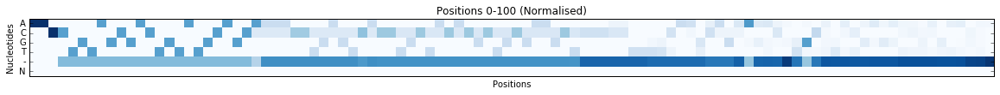

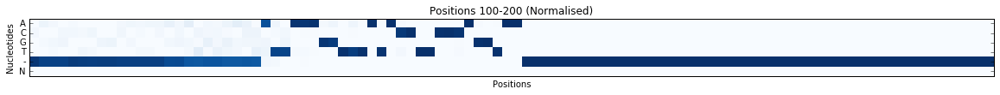

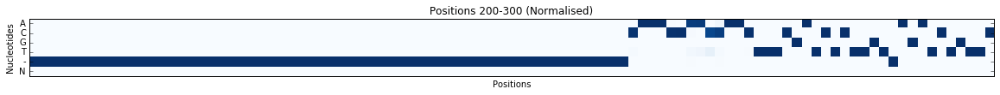

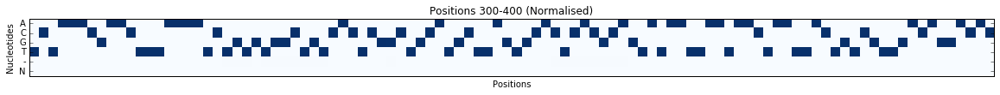

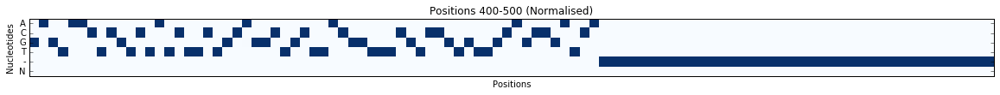

...

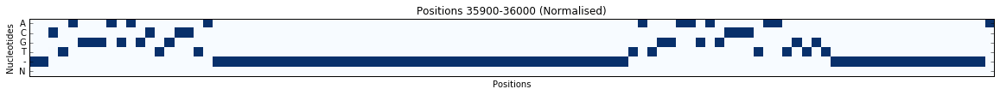

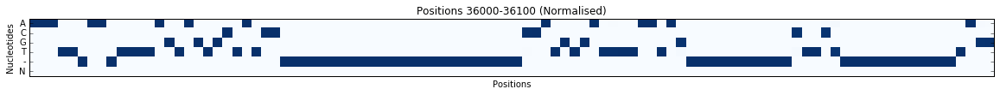

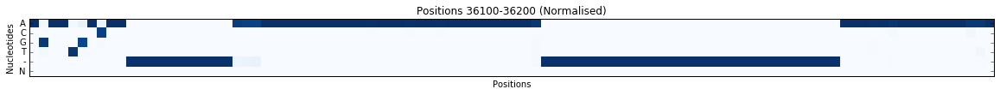

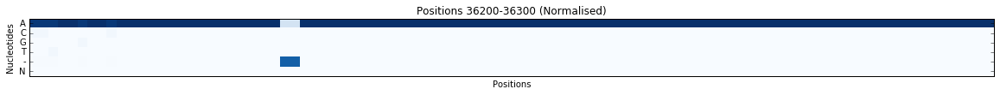

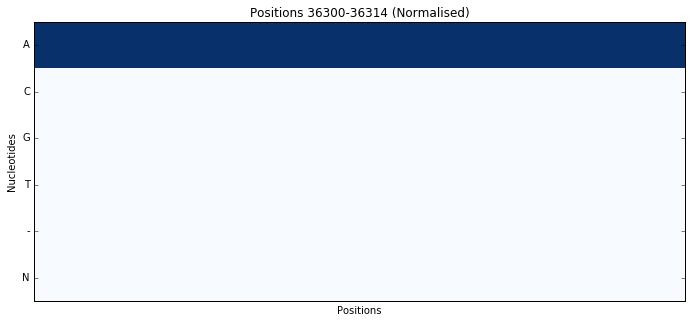


Visualising the selected hotspots data...


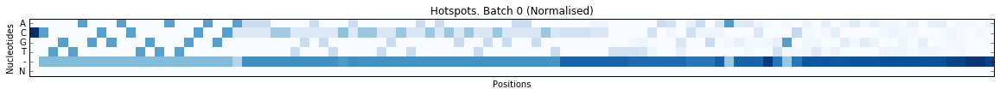

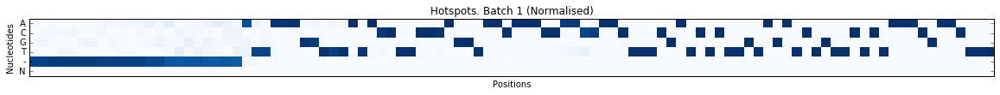

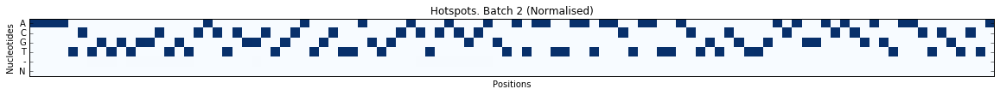

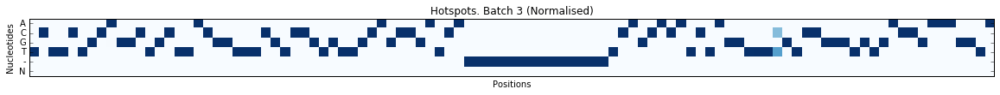

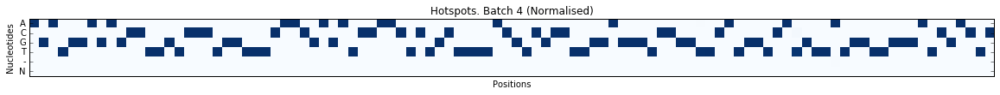

...

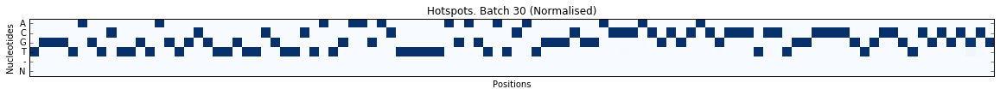

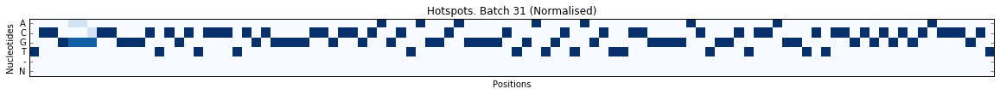

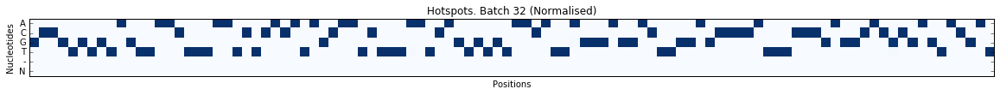

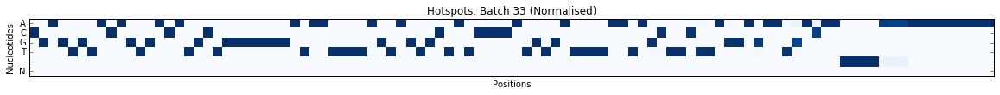

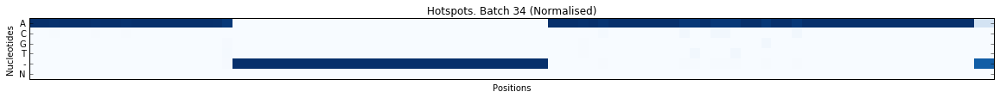

In [7]:
# Load a fasta file and convert it into a dict
infile = 'data/2020-05-07/gisaid_cov2020.train_50.augur_seq.ali.fasta.gz'
print("\nConverting ", infile, " into dict...")
fasta_file_temp = fasta_to_dict(infile)
print("\tNumber of keys in dict: ", len(list(fasta_file_temp.keys())))

# Work only with the leaves
max_length = 0
length_dist = {}
fasta_file = {}
for key in fasta_file_temp:
    if key[0:3] == "EPI":
        fasta_file[key] = fasta_file_temp[key]
        seq_len = len(fasta_file[key])
        max_length = max(max_length, seq_len)
        if seq_len not in length_dist:
            length_dist[seq_len] = 1
        else:
            length_dist[seq_len] = length_dist[seq_len] + 1
        
print("\tNumber of observations in dict: ", len(list(fasta_file.keys())))
print("\tMaximum sequence length: ", max_length)
print("\tSequence length distribution:")
for key in sorted(length_dist.keys()):
    print("\tLength: ", key, "\tOccurrence: ", length_dist[key])
    
train_data, train_majority_perc_dict, train_hotspots, train_hotspot_mat = find_hotspots(fasta_file)

print("\nVisualising the normalised train data...")
plot_data = np.copy(train_data)
batch_size = 100
i=0
while (i+1)*batch_size <= plot_data.shape[1]:
    plot_sequence_heatmap(plot_data[:,i*batch_size:(i+1)*batch_size], title="Positions %s-%s (Normalised)" % (i*batch_size,(i+1)*batch_size))
    i = i+1
plot_sequence_heatmap(plot_data[:,i*batch_size:min((i+1)*batch_size, plot_data.shape[1])], title="Positions %s-%s (Normalised)" % (i*batch_size,min((i+1)*batch_size, plot_data.shape[1])))

print("\nVisualising the selected hotspots data...")
plot_data = np.copy(train_hotspot_mat)
batch_size = 100
i=0
while (i+1)*batch_size <= plot_data.shape[1]:
    plot_sequence_heatmap(plot_data[:,i*batch_size:(i+1)*batch_size], title="Hotspots. Batch %d (Normalised)" % i)
    i = i+1
plot_sequence_heatmap(plot_data[:,i*batch_size:min((i+1)*batch_size, plot_data.shape[1])], title="Hotspots. Batch %d (Normalised)" % i)

### 50/50 Test


Converting  data/2020-05-07/gisaid_cov2020.test_50.augur_seq.ali.fasta.gz  into dict...
	Number of keys in dict:  7299
	Number of observations in dict:  3650
	Maximum sequence length:  34292
	Sequence length distribution:
	Length:  34292 	Occurrence:  3650

Finding hotspots...

Marginal one-hot sequence matrix is creating...
Creating marginal of one-hot sequence matrix...
	data.shape:  (6, 34292)
Normalising the data matrix...
Calculating the majority percentages...
	Majority Perc.:  0.471 	Occurrence:  1
	Majority Perc.:  0.559 	Occurrence:  1
	Majority Perc.:  0.563 	Occurrence:  1
	Majority Perc.:  0.564 	Occurrence:  1
	Majority Perc.:  0.565 	Occurrence:  1
	Majority Perc.:  0.591 	Occurrence:  1
	Majority Perc.:  0.593 	Occurrence:  1
	Majority Perc.:  0.642 	Occurrence:  8
	Majority Perc.:  0.655 	Occurrence:  1
	Majority Perc.:  0.659 	Occurrence:  1
	Majority Perc.:  0.664 	Occurrence:  1
	Majority Perc.:  0.667 	Occurrence:  2
	Majority Perc.:  0.731 	Occurrence:  1
	Majorit

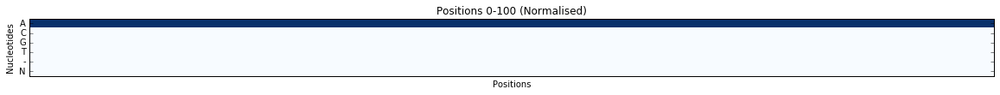

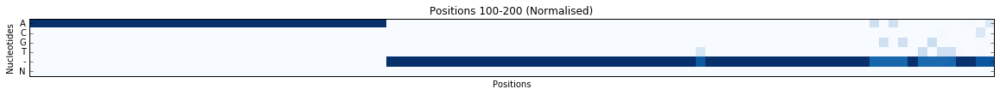

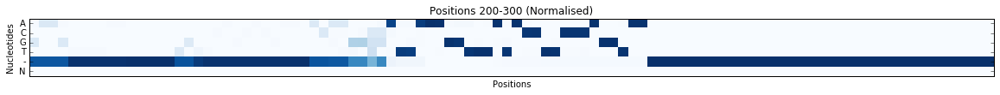

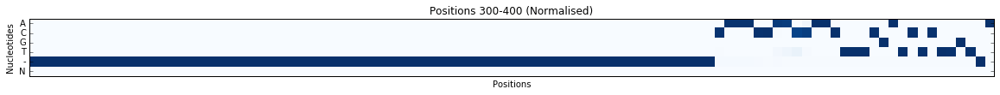

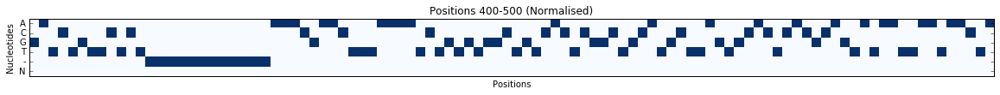

...

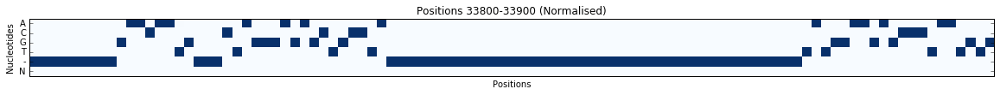

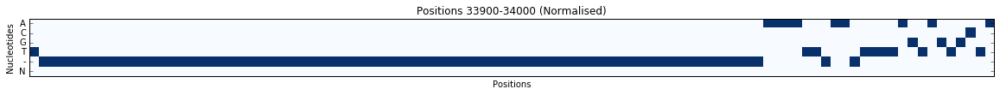

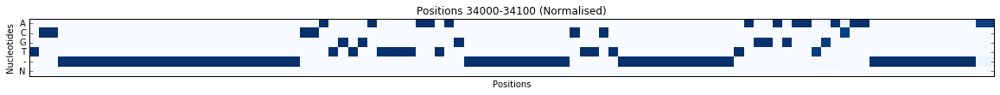

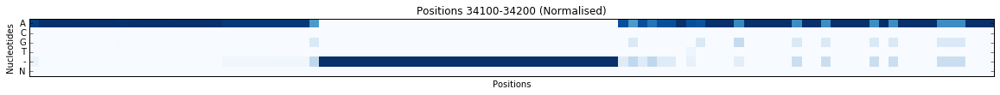

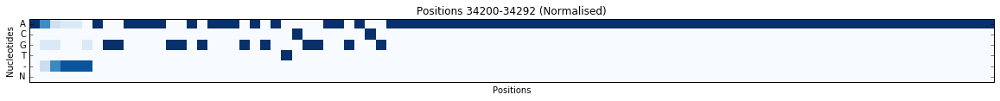


Visualising the selected hotspots data...


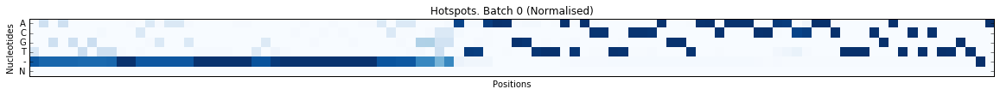

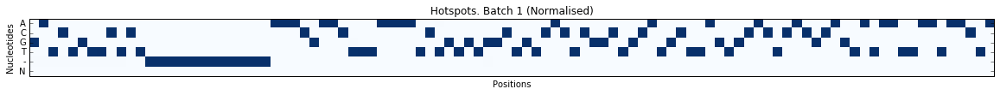

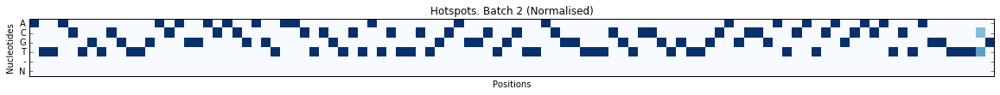

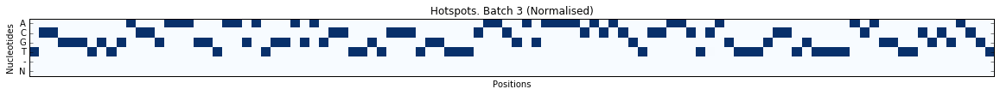

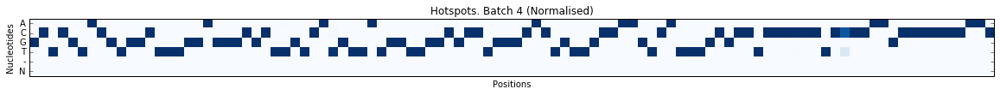

...

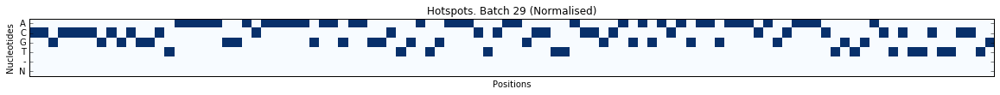

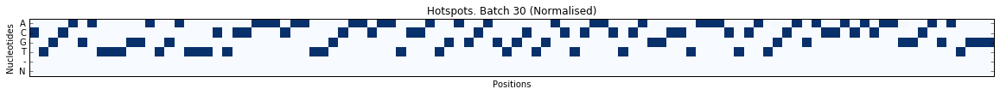

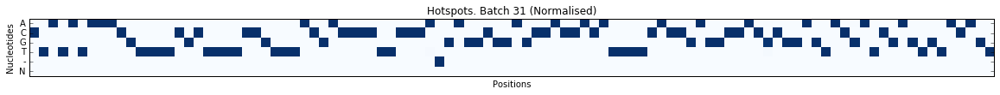

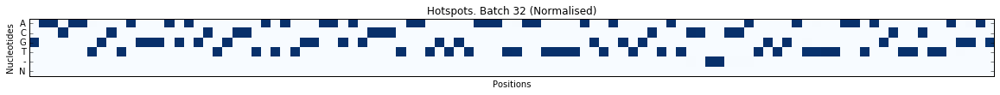

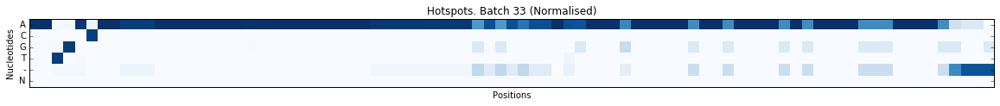

In [8]:
# Load a fasta file and convert it into a dict
infile = 'data/2020-05-07/gisaid_cov2020.test_50.augur_seq.ali.fasta.gz'
print("\nConverting ", infile, " into dict...")
fasta_file_temp = fasta_to_dict(infile)
print("\tNumber of keys in dict: ", len(list(fasta_file_temp.keys())))

# Work only with the leaves
max_length = 0
length_dist = {}
fasta_file = {}
for key in fasta_file_temp:
    if key[0:3] == "EPI":
        fasta_file[key] = fasta_file_temp[key]
        seq_len = len(fasta_file[key])
        max_length = max(max_length, seq_len)
        if seq_len not in length_dist:
            length_dist[seq_len] = 1
        else:
            length_dist[seq_len] = length_dist[seq_len] + 1
        
print("\tNumber of observations in dict: ", len(list(fasta_file.keys())))
print("\tMaximum sequence length: ", max_length)
print("\tSequence length distribution:")
for key in sorted(length_dist.keys()):
    print("\tLength: ", key, "\tOccurrence: ", length_dist[key])
    
test_data, test_majority_perc_dict, test_hotspots, test_hotspot_mat = find_hotspots(fasta_file)

print("\nVisualising the normalised train data...")
plot_data = np.copy(test_data)
batch_size = 100
i=0
while (i+1)*batch_size <= plot_data.shape[1]:
    plot_sequence_heatmap(plot_data[:,i*batch_size:(i+1)*batch_size], title="Positions %s-%s (Normalised)" % (i*batch_size,(i+1)*batch_size))
    i = i+1
plot_sequence_heatmap(plot_data[:,i*batch_size:min((i+1)*batch_size, plot_data.shape[1])], title="Positions %s-%s (Normalised)" % (i*batch_size,min((i+1)*batch_size, plot_data.shape[1])))

print("\nVisualising the selected hotspots data...")
plot_data = np.copy(test_hotspot_mat)
batch_size = 100
i=0
while (i+1)*batch_size <= plot_data.shape[1]:
    plot_sequence_heatmap(plot_data[:,i*batch_size:(i+1)*batch_size], title="Hotspots. Batch %d (Normalised)" % i)
    i = i+1
plot_sequence_heatmap(plot_data[:,i*batch_size:min((i+1)*batch_size, plot_data.shape[1])], title="Hotspots. Batch %d (Normalised)" % i)

### Find the common hotspots in train and test sets

In [9]:
count_train = len(train_hotspots)
count_test = len(test_hotspots)

combined_set = set(train_hotspots)
for pos in test_hotspots:
    combined_set.add(pos)
combined_set = sorted(list(combined_set))
    
print("Train_count: \t", count_train)
print("Test_count: \t", count_test)
print("Combined_count: \t", len(combined_set))
print("Same hotspot count: \t", count_train+count_test-len(combined_set))

Train_count: 	 3495
Test_count: 	 3385
Combined_count: 	 6233
Same hotspot count: 	 647


### 80/20 Training


Converting  data/2020-05-07/gisaid_cov2020.train_80.augur_seq.ali.fasta.gz  into dict...
	Number of keys in dict:  11677
	Number of observations in dict:  5839
	Maximum sequence length:  38245
	Sequence length distribution:
	Length:  38245 	Occurrence:  5839

Finding hotspots...

Marginal one-hot sequence matrix is creating...
Creating marginal of one-hot sequence matrix...
	data.shape:  (6, 38245)
Normalising the data matrix...
Calculating the majority percentages...
	Majority Perc.:  0.455 	Occurrence:  1
	Majority Perc.:  0.536 	Occurrence:  1
	Majority Perc.:  0.562 	Occurrence:  1
	Majority Perc.:  0.564 	Occurrence:  1
	Majority Perc.:  0.566 	Occurrence:  1
	Majority Perc.:  0.567 	Occurrence:  1
	Majority Perc.:  0.569 	Occurrence:  1
	Majority Perc.:  0.574 	Occurrence:  1
	Majority Perc.:  0.577 	Occurrence:  1
	Majority Perc.:  0.578 	Occurrence:  2
	Majority Perc.:  0.6 	Occurrence:  1
	Majority Perc.:  0.606 	Occurrence:  17
	Majority Perc.:  0.607 	Occurrence:  21
	Major

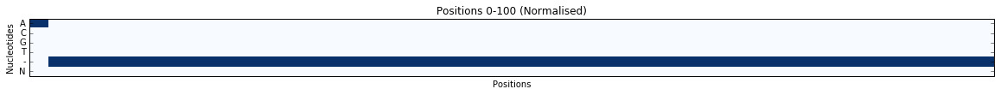

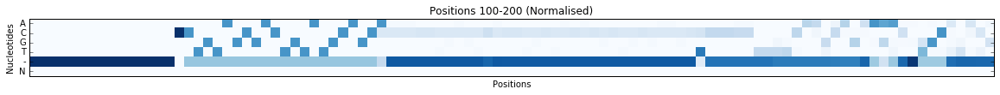

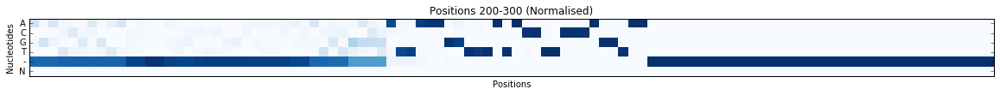

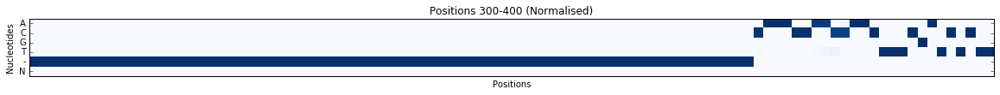

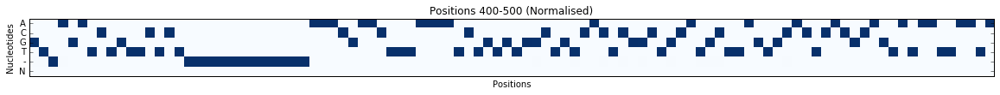

...

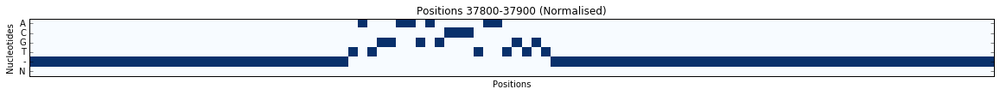

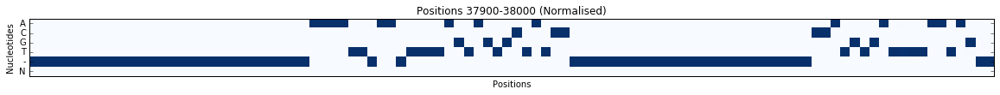

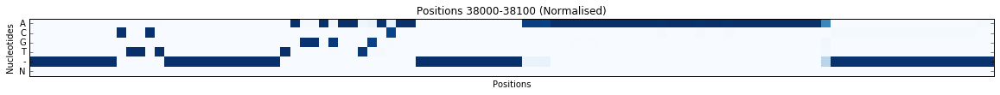

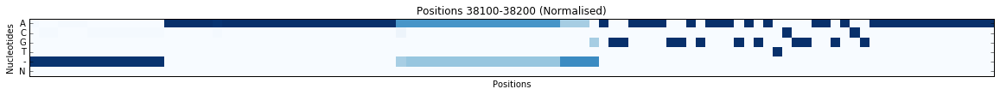

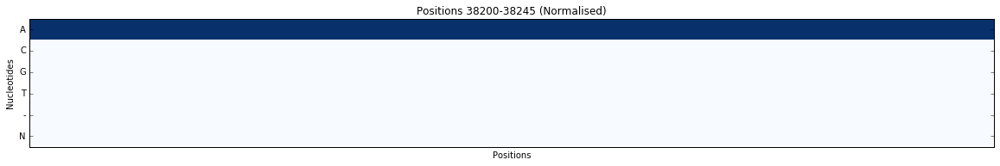


Visualising the selected hotspots data...


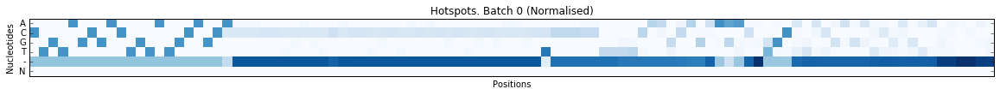

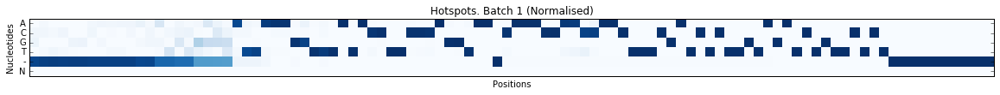

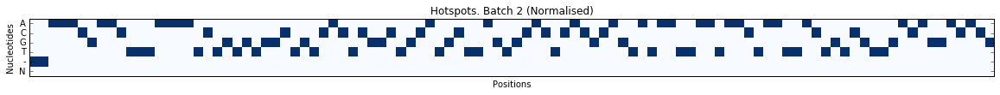

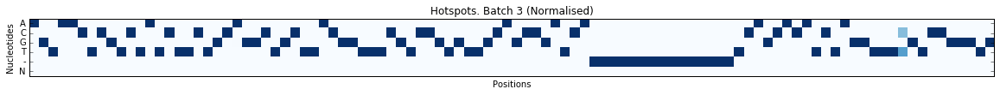

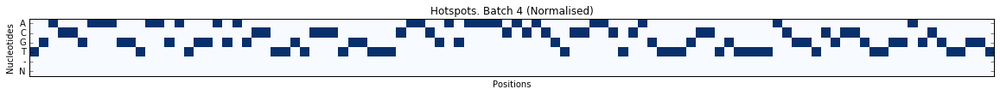

...

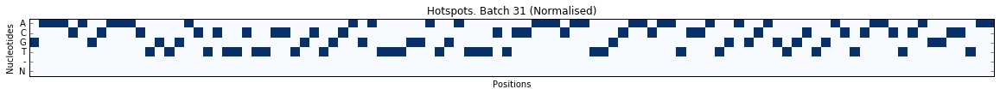

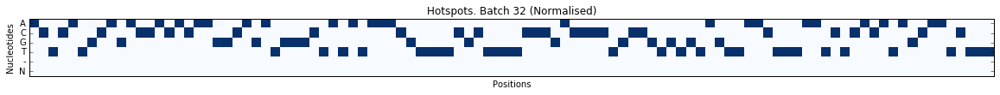

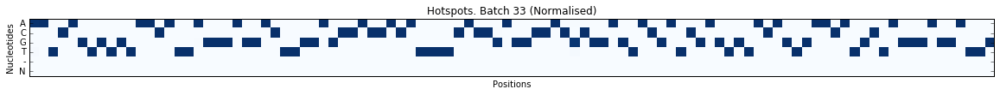

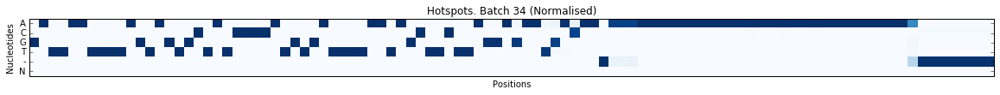

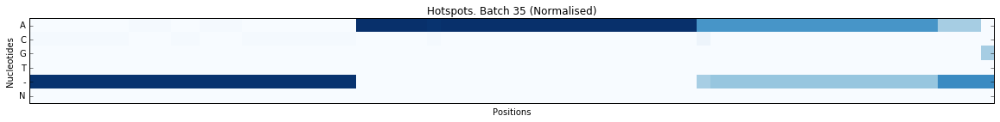

In [10]:
# Load a fasta file and convert it into a dict
infile = 'data/2020-05-07/gisaid_cov2020.train_80.augur_seq.ali.fasta.gz'
print("\nConverting ", infile, " into dict...")
fasta_file_temp = fasta_to_dict(infile)
print("\tNumber of keys in dict: ", len(list(fasta_file_temp.keys())))

# Work only with the leaves
max_length = 0
length_dist = {}
fasta_file = {}
for key in fasta_file_temp:
    if key[0:3] == "EPI":
        fasta_file[key] = fasta_file_temp[key]
        seq_len = len(fasta_file[key])
        max_length = max(max_length, seq_len)
        if seq_len not in length_dist:
            length_dist[seq_len] = 1
        else:
            length_dist[seq_len] = length_dist[seq_len] + 1
        
print("\tNumber of observations in dict: ", len(list(fasta_file.keys())))
print("\tMaximum sequence length: ", max_length)
print("\tSequence length distribution:")
for key in sorted(length_dist.keys()):
    print("\tLength: ", key, "\tOccurrence: ", length_dist[key])
    
train_data, train_majority_perc_dict, train_hotspots, train_hotspot_mat = find_hotspots(fasta_file)

print("\nVisualising the normalised train data...")
plot_data = np.copy(train_data)
batch_size = 100
i=0
while (i+1)*batch_size <= plot_data.shape[1]:
    plot_sequence_heatmap(plot_data[:,i*batch_size:(i+1)*batch_size], title="Positions %s-%s (Normalised)" % (i*batch_size,(i+1)*batch_size))
    i = i+1
plot_sequence_heatmap(plot_data[:,i*batch_size:min((i+1)*batch_size, plot_data.shape[1])], title="Positions %s-%s (Normalised)" % (i*batch_size,min((i+1)*batch_size, plot_data.shape[1])))

print("\nVisualising the selected hotspots data...")
plot_data = np.copy(train_hotspot_mat)
batch_size = 100
i=0
while (i+1)*batch_size <= plot_data.shape[1]:
    plot_sequence_heatmap(plot_data[:,i*batch_size:(i+1)*batch_size], title="Hotspots. Batch %d (Normalised)" % i)
    i = i+1
plot_sequence_heatmap(plot_data[:,i*batch_size:min((i+1)*batch_size, plot_data.shape[1])], title="Hotspots. Batch %d (Normalised)" % i)

### 80/20 Test


Converting  data/2020-05-07/gisaid_cov2020.test_20.augur_seq.ali.fasta.gz  into dict...
	Number of keys in dict:  2921
	Number of observations in dict:  1461
	Maximum sequence length:  31832
	Sequence length distribution:
	Length:  31832 	Occurrence:  1461

Finding hotspots...

Marginal one-hot sequence matrix is creating...
Creating marginal of one-hot sequence matrix...
	data.shape:  (6, 31832)
Normalising the data matrix...
Calculating the majority percentages...
	Majority Perc.:  0.507 	Occurrence:  1
	Majority Perc.:  0.543 	Occurrence:  1
	Majority Perc.:  0.546 	Occurrence:  1
	Majority Perc.:  0.548 	Occurrence:  1
	Majority Perc.:  0.55 	Occurrence:  1
	Majority Perc.:  0.551 	Occurrence:  1
	Majority Perc.:  0.709 	Occurrence:  1
	Majority Perc.:  0.71 	Occurrence:  3
	Majority Perc.:  0.711 	Occurrence:  6
	Majority Perc.:  0.745 	Occurrence:  33
	Majority Perc.:  0.754 	Occurrence:  1
	Majority Perc.:  0.784 	Occurrence:  1
	Majority Perc.:  0.802 	Occurrence:  2
	Majority

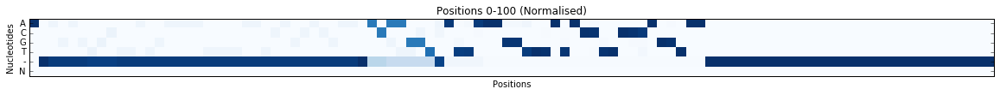

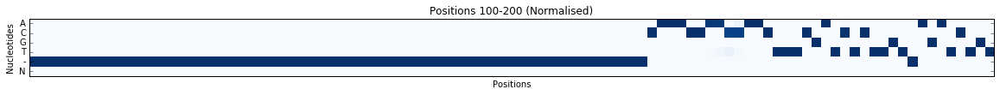

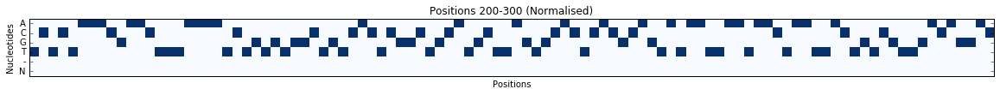

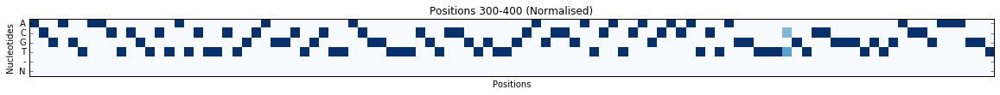

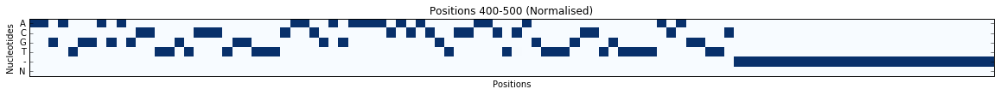

...

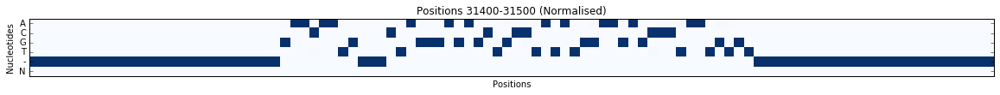

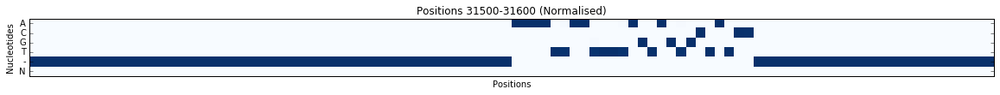

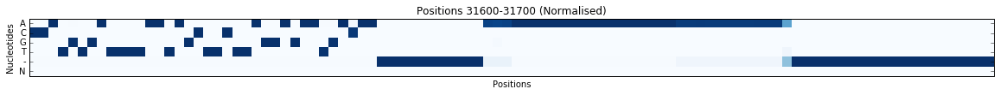

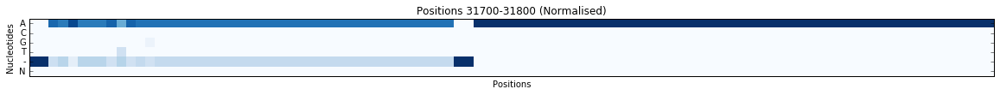

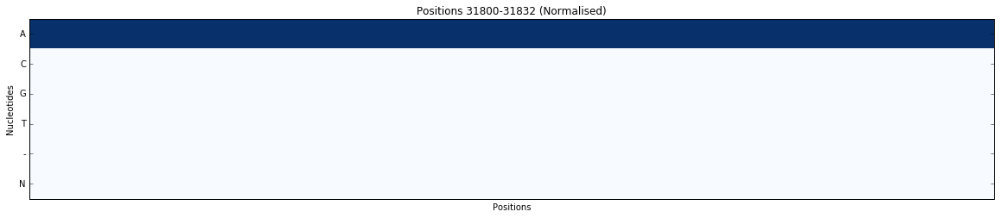


Visualising the selected hotspots data...


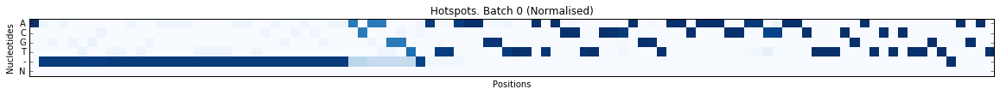

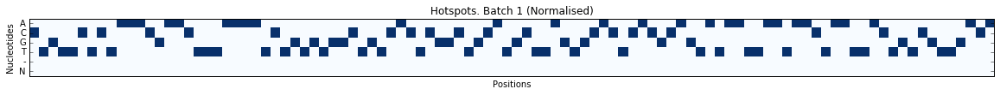

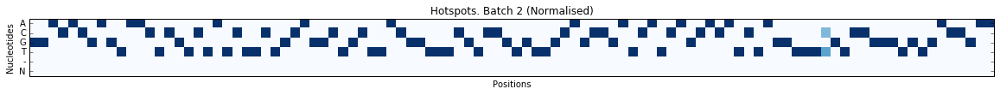

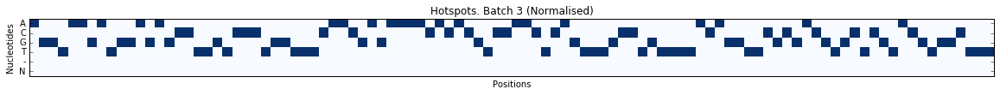

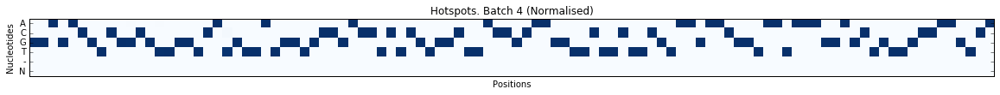

...

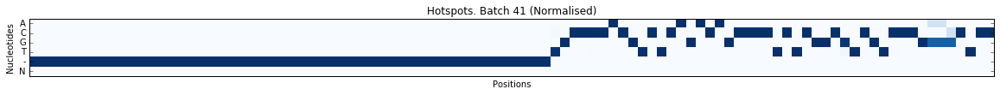

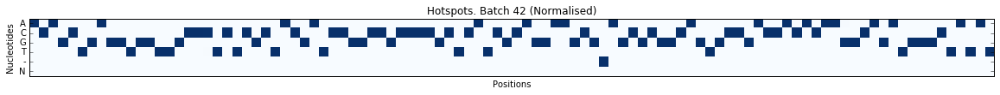

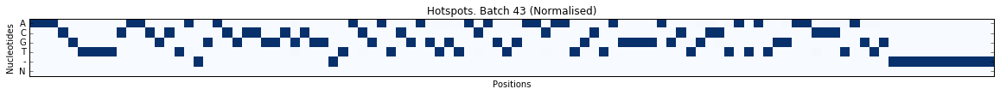

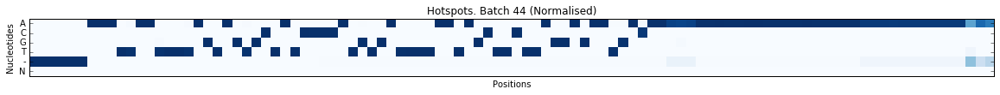

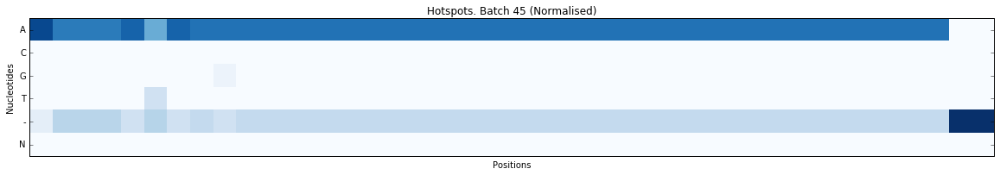

In [11]:
# Load a fasta file and convert it into a dict
infile = 'data/2020-05-07/gisaid_cov2020.test_20.augur_seq.ali.fasta.gz'
print("\nConverting ", infile, " into dict...")
fasta_file_temp = fasta_to_dict(infile)
print("\tNumber of keys in dict: ", len(list(fasta_file_temp.keys())))

# Work only with the leaves
max_length = 0
length_dist = {}
fasta_file = {}
for key in fasta_file_temp:
    if key[0:3] == "EPI":
        fasta_file[key] = fasta_file_temp[key]
        seq_len = len(fasta_file[key])
        max_length = max(max_length, seq_len)
        if seq_len not in length_dist:
            length_dist[seq_len] = 1
        else:
            length_dist[seq_len] = length_dist[seq_len] + 1
        
print("\tNumber of observations in dict: ", len(list(fasta_file.keys())))
print("\tMaximum sequence length: ", max_length)
print("\tSequence length distribution:")
for key in sorted(length_dist.keys()):
    print("\tLength: ", key, "\tOccurrence: ", length_dist[key])
    
test_data, test_majority_perc_dict, test_hotspots, test_hotspot_mat = find_hotspots(fasta_file)

print("\nVisualising the normalised train data...")
plot_data = np.copy(test_data)
batch_size = 100
i=0
while (i+1)*batch_size <= plot_data.shape[1]:
    plot_sequence_heatmap(plot_data[:,i*batch_size:(i+1)*batch_size], title="Positions %s-%s (Normalised)" % (i*batch_size,(i+1)*batch_size))
    i = i+1
plot_sequence_heatmap(plot_data[:,i*batch_size:min((i+1)*batch_size, plot_data.shape[1])], title="Positions %s-%s (Normalised)" % (i*batch_size,min((i+1)*batch_size, plot_data.shape[1])))

print("\nVisualising the selected hotspots data...")
plot_data = np.copy(test_hotspot_mat)
batch_size = 100
i=0
while (i+1)*batch_size <= plot_data.shape[1]:
    plot_sequence_heatmap(plot_data[:,i*batch_size:(i+1)*batch_size], title="Hotspots. Batch %d (Normalised)" % i)
    i = i+1
plot_sequence_heatmap(plot_data[:,i*batch_size:min((i+1)*batch_size, plot_data.shape[1])], title="Hotspots. Batch %d (Normalised)" % i)

### Find the common hotspots in train and test sets

In [12]:
count_train = len(train_hotspots)
count_test = len(test_hotspots)

combined_set = set(train_hotspots)
for pos in test_hotspots:
    combined_set.add(pos)
combined_set = sorted(list(combined_set))
    
print("Train_count: \t", count_train)
print("Test_count: \t", count_test)
print("Combined_count: \t", len(combined_set))
print("Same hotspot count: \t", count_train+count_test-len(combined_set))

Train_count: 	 3568
Test_count: 	 4542
Combined_count: 	 7439
Same hotspot count: 	 671
